## Palm Movement Detection using Optical Flow

This lab is part of [AI for Beginners Curriculum](http://aka.ms/ai-beginners).

Consider [this video](palm-movement.mp4), in which a person's palm moves left/right/up/down on the stable background.

<img src="../images/palm-movement.png" width="30%" alt="Palm Movement Frame"/>

**Your goal** would be to use Optical Flow to determine, which parts of video contain up/down/left/right movements. 

Start by getting video frames as described in the lecture:

In [19]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [6]:
def display_images(l,titles=None,fontsize=12):
    n=len(l)
    fig,ax = plt.subplots(1,n)
    for i,im in enumerate(l):
        ax[i].imshow(im)
        ax[i].axis('off')
        if titles is not None:
            ax[i].set_title(titles[i],fontsize=fontsize)
    fig.set_size_inches(fig.get_size_inches()*n)
    plt.tight_layout()
    plt.show()


Total frames: 242


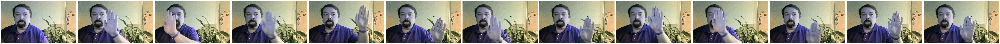

In [24]:
vid = cv2.VideoCapture('palm-movement.mp4')

c = 0
frames = []
while vid.isOpened():
    ret, frame = vid.read()
    if not ret:
        break
    frames.append(frame)
    c+=1
vid.release()
print(f"Total frames: {c}")
display_images(frames[::20])

Now, calculate dense optical flow frames as described in the lecture, and convert dense optical flow to polar coordinates: 

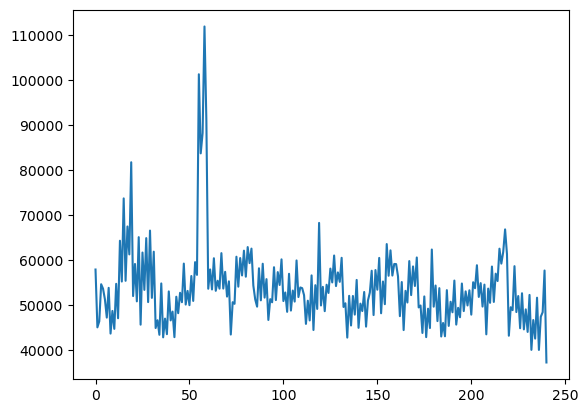

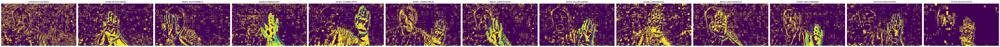

In [28]:
bwframes = [cv2.cvtColor(x, cv2.COLOR_BGR2GRAY) for x in frames]
diffs = [(p2 - p1) for p1,p2 in zip(bwframes[:-1], bwframes[1:])]
diff_amps = np.array([np.linalg.norm(x) for x in diffs])
plt.plot(diff_amps)
display_images(diffs[::20], titles=diff_amps[::20])

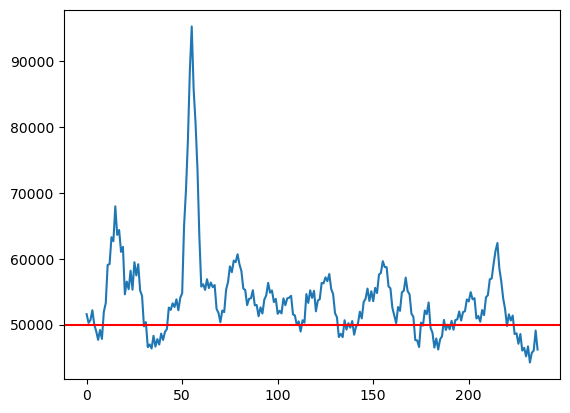

In [42]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

threshold = 50000

plt.plot(moving_average(diff_amps, 5))
plt.axhline(y=threshold, color='r', linestyle='-')

In [44]:
active_frames = np.where(diff_amps > threshold)[0]

def subsequence(seq, min_length=30):
    ss = []
    for i,x in enumerate(seq[:-1]):
        ss.append(x)
        if x+1 != seq[i+1]:
            if len(ss) > min_length: return ss
            ss.clear()

sub = subsequence(active_frames, 5)
print(sub)
print(len(sub))

[np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23)]
11


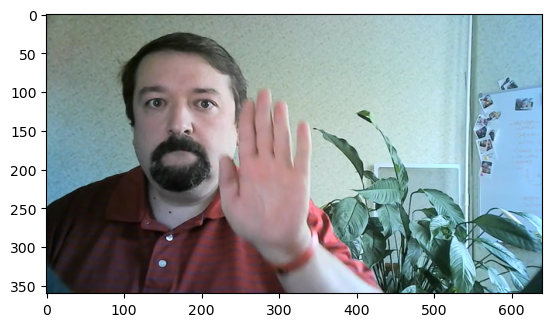

In [45]:
plt.imshow(cv2.cvtColor(frames[(sub[0]+sub[-1])//2],cv2.COLOR_BGR2RGB))

In [46]:
flows = [cv2.calcOpticalFlowFarneback(f1, f2, None, 0.5, 3, 15, 3, 5, 1.2, 0)
            for f1,f2 in zip(bwframes[:-1], bwframes[1:])]
flows[0].shape

(360, 640, 2)

13 23


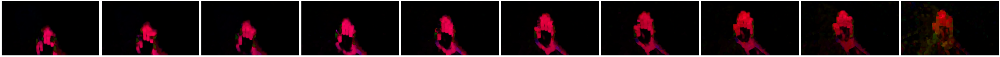

In [47]:
def flow_to_hsv(flow):
    hsvImg = np.zeros((flow.shape[0], flow.shape[1], 3), dtype=np.uint8)
    mag, ang = cv2.cartToPolar(flow[...,0], flow[..., 1])
    hsvImg[..., 0] = 0.5 * ang * 180 / np.pi
    hsvImg[..., 1] = 255
    hsvImg[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    return cv2.cvtColor(hsvImg, cv2.COLOR_HSV2BGR)

start = sub[0]
stop = sub[-1]
print(start, stop)

frms = [flow_to_hsv(x) for x in flows[start:stop]]
display_images(frms)

Build histogram of directions for each of the optical flow frame. A histogram shows how many vectors fall under certain bin, and it should separate out different directions of movement on the frame.

> You may also want to zero out all vectors whose magnitude is below certain threshold. This will get rid of small extra movements in the video, such as eyes and head.

Plot the histograms for some of the frames.

In [48]:
def flow_direction_histogram(flow, magnitude_thresh=1.0, num_bins=36):
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # filter out low-magnitude vectors
    mask = mag > magnitude_thresh
    filtered_angles = ang[mask]

    # convert to degrees
    angles_deg = np.degrees(filtered_angles)

    # histogram of angles
    hist, bin_edges = np.histogram(angles_deg, bins=num_bins, range=(0, 360))

    return hist, bin_edges

In [51]:
def plot_direction_histogram(hist, bin_edges, title="Optical Flow Direction Histogram"):
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    plt.figure(figsize=(6, 4))
    plt.bar(bin_centers, hist, width=360/len(hist), align='center', edgecolor='black')
    plt.xlabel('Direction (degrees)')
    plt.ylabel('Count')
    plt.title(title)
    plt.xticks(np.arange(0, 361, 45))
    plt.grid(True)
    plt.show()

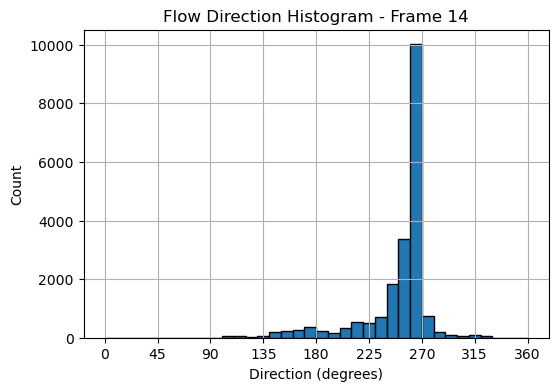

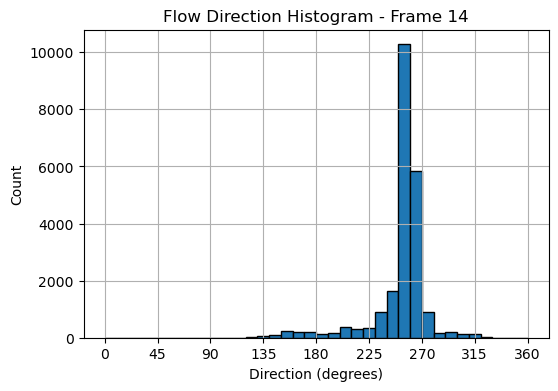

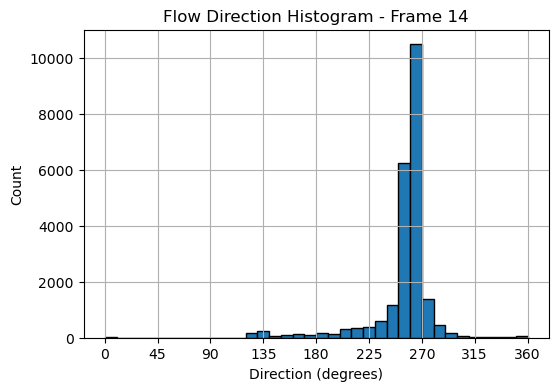

In [52]:
for i,flow in enumerate(flows[start:start+3]):
    hist, bins = flow_direction_histogram(flow, magnitude_thresh=1.5, num_bins=36)
    plot_direction_histogram(hist, bins, title=f"Flow Direction Histogram - Frame {start + 1}")

Looking at histograms, it should be pretty straightforward how to determine direction of movement. You need so select those bins the correspond to up/down/left/right directions, and that are above certain threshold.

In [53]:
def detect_dominant_direction(hist, threshold_ratio=0.1):
    total = np.sum(hist)
    if total == 0: return []

    # define bin ranges for each direction (with 36 bins)
    dir_bins = {
        'right': list(range(0, 5)) + [35],
        'down': list(range(5, 14)), 
        'left': list(range(14, 23)), 
        'up': list(range(23, 32))
    }

    # get counts for each direction
    direction_counts = {
        direction: np.sum([hist[i] for i in indices])
        for direction,indices in dir_bins.items()
    }

    # determine directions above threshold
    dominant_dirs = [d for d,count in direction_counts.items() if count / total > threshold_ratio]

    return dominant_dirs

Frame 13 dominant directions: ['left', 'up']


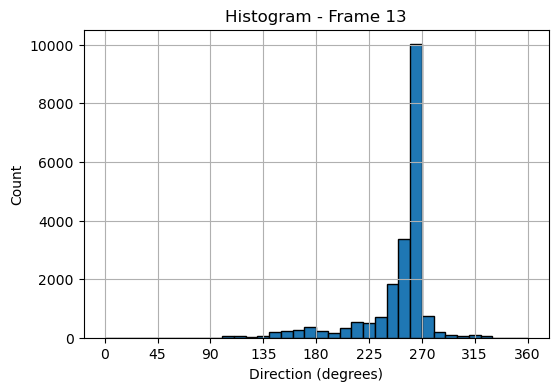

Frame 14 dominant directions: ['up']


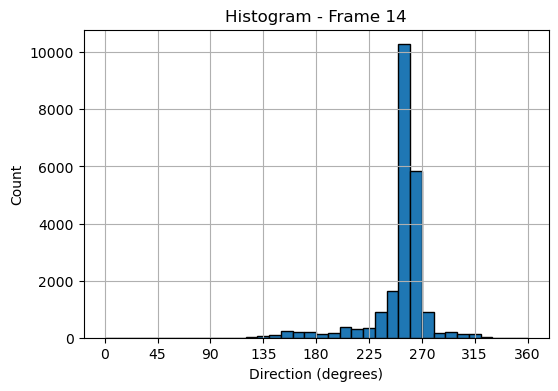

Frame 15 dominant directions: ['up']


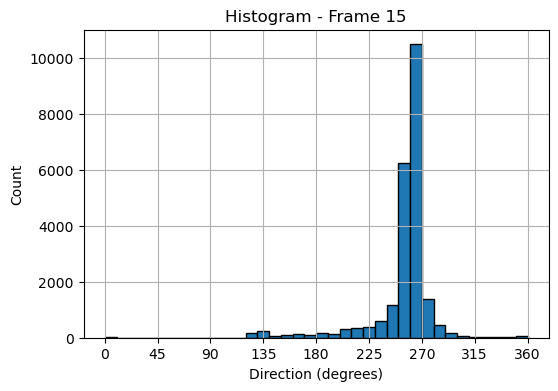

Frame 16 dominant directions: ['up']


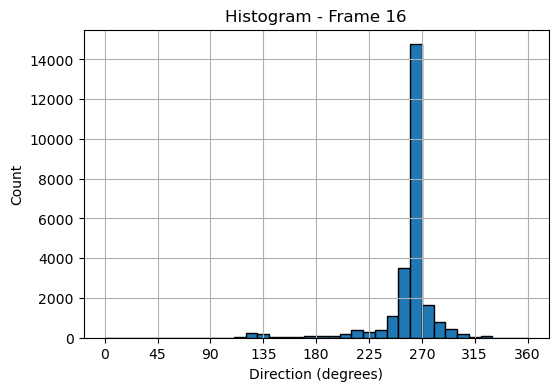

Frame 17 dominant directions: ['up']


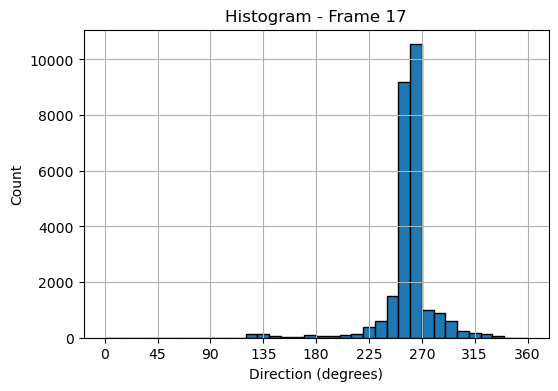

In [54]:
for i,flow in enumerate(flows[start:start+5]):
    hist, bins = flow_direction_histogram(flow, magnitude_thresh=1.5, num_bins=36)
    dirs = detect_dominant_direction(hist, threshold_ratio=0.1)
    print(f"Frame {start + i} dominant directions: {dirs}")
    plot_direction_histogram(hist, bins, title=f"Histogram - Frame {start + i}")

Congratulations! If you have done all steps above, you have completed the lab!